In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
import PIL
import os
from PIL import Image, ImageOps
import glob
import cv2
import matplotlib.pyplot as plt

In [3]:
import re, numpy as np

dirs = os.listdir('../Dataset')
label = 0
im_arr = []
lb_arr = []
X = []
y = []
for i in dirs: #loop all directory
    count = 0
    for pic in glob.glob('../Dataset/'+i+'/*'):
        im = cv2.imread(pic)
        if im is not None:  # Check if the image was loaded successfully
            im = cv2.resize(im, (224, 224))
            im = np.array(im)
            count = count + 1
            X.append(im)
            y.append(label)
            if count <= 10:
                im_arr.append({str(i): im})
        else:
            print(f"Failed to load image: {pic}")
            
    print("Jumlah "+str(i)+" : "+str(count))
    label = label + 1
    lb_arr.append(i)
X = np.array(X)
y = np.array(y);

Jumlah batik_sinaran : 50
Jumlah batik_sembagi : 50
Jumlah batik_abstrak : 50
Jumlah batik_jung_agung : 50
Jumlah batik_granitan : 50
Jumlah batik_siger_ratu_agung : 50
Jumlah batik_kembang_cengkih : 50
Jumlah batik_kambil_sicukil : 50
Jumlah batik_tambal : 50
Jumlah batik_sekar_jagat : 50


In [4]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

X_train, X_other, y_train, y_other = train_test_split(X, y, train_size=0.70, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_other, y_other, test_size=0.5, random_state=42)
X_train = X_train.astype('float32')
X_valid = X_valid.astype('float32')
X_test = X_test.astype('float32')
X_train /= 255
X_valid /= 255
X_test /= 255
y_train = to_categorical(y_train, len(dirs))
y_valid = to_categorical(y_valid, len(dirs))
y_test = to_categorical(y_test, len(dirs))
print("Found "+str(X_train.shape[0])+" trained image filenames belonging "+str(len(dirs))+" class")
print("Found "+str(X_valid.shape[0])+" validated image filenames belonging "+str(len(dirs))+" class")
print("Found "+str(X_test.shape[0])+" tested image filenames belonging "+str(len(dirs))+" class")

Found 350 trained image filenames belonging 10 class
Found 75 validated image filenames belonging 10 class
Found 75 tested image filenames belonging 10 class


In [5]:
# from keras.preprocessing.image import ImageDataGenerator

# datagen = tf.keras.preprocessing.image.ImageDataGenerator(
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     shear_range=0.2,
#     fill_mode='constant', #untuk mengisi hasil zoom/rotate/shift yang kosong
#     cval=0, #fill_mode warna hitam
#     vertical_flip=True,
#     horizontal_flip=True)

# datagens = tf.keras.preprocessing.image.ImageDataGenerator(
#     vertical_flip=True,
#     horizontal_flip=True)

In [6]:
input_shape = (224, 224, 3)
base_model=tf.keras.applications.MobileNet(input_shape=input_shape,
                                           dropout=0.1,
                                           include_top=False,
                                           weights='imagenet')

In [7]:
base_model.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 112, 32

In [8]:
model = tf.keras.Sequential([
                             base_model,
                             tf.keras.layers.Conv2D(32,3, activation='relu'),
                             tf.keras.layers.Dense(128, activation='relu'),
                             tf.keras.layers.GlobalAveragePooling2D(),
                             tf.keras.layers.Dense(10,activation='softmax')
])

In [9]:
from tensorflow.keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
import h5py
from sklearn.model_selection import train_test_split
epochs = 20
lrate = 0.001
# mod_chk= ModelCheckpoint(filepath='/content/drive/MyDrive/Model_Process/mobilenetmodel.hdf5',monitor='val_loss',save_best_only=True)
adam = Adam(learning_rate=lrate)
model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenet_1.00_224 (Function (None, 7, 7, 1024)        3228864   
_________________________________________________________________
conv2d (Conv2D)              (None, 5, 5, 32)          294944    
_________________________________________________________________
dense (Dense)                (None, 5, 5, 128)         4224      
_________________________________________________________________
global_average_pooling2d (Gl (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                1290      
Total params: 3,529,322
Trainable params: 3,507,434
Non-trainable params: 21,888
_________________________________________________________________


In [10]:
#dengan augmentasi
# history = model.fit(datagen.flow(X_train, y_train, validation_data=(X_valid, y_valid), epochs=epochs, batch_size=32))
# history = model.fit(datagen.flow(X_train, y_train, batch_size=32),
#          validation_data=datagens.flow(X_valid, y_valid,
#          batch_size=8),epochs=epochs, shuffle=True, callbacks=[mod_chk])
# scores = model.evaluate(X_test, y_test, verbose=0)
# print("Accuracy: %.2f%%" % (scores[1]*100))

In [11]:
#tanpa augmentasi
history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid), epochs=epochs, batch_size=32)
scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Epoch 1/20
11/11 [==============================] - 57s 3s/step - loss: 1.1143 - accuracy: 0.6643 - val_loss: 3.5399 - val_accuracy: 0.5467
Epoch 2/20
11/11 [==============================] - 3s 311ms/step - loss: 0.0095 - accuracy: 0.9945 - val_loss: 7.7967 - val_accuracy: 0.4667
Epoch 3/20
11/11 [==============================] - 3s 304ms/step - loss: 0.0029 - accuracy: 0.9995 - val_loss: 4.6697 - val_accuracy: 0.4667
Epoch 4/20
11/11 [==============================] - 3s 301ms/step - loss: 0.0062 - accuracy: 0.9990 - val_loss: 2.9165 - val_accuracy: 0.6400
Epoch 5/20
11/11 [==============================] - 3s 306ms/step - loss: 0.0614 - accuracy: 0.9876 - val_loss: 9.7219 - val_accuracy: 0.5067
Epoch 6/20
11/11 [==============================] - 3s 307ms/step - loss: 0.2779 - accuracy: 0.9368 - val_loss: 4.1196 - val_accuracy: 0.6533
Epoch 7/20
11/11 [==============================] - 3s 305ms/step - loss: 0.0372 - accuracy: 0.9818 - val_loss: 15.4128 - val_accuracy: 0.4267
Epoch 8

In [12]:
test_loss, test_acc = model.evaluate(X_test,  y_test, verbose=1)
print('\nTest accuracy:', test_acc)

3/3 [==============================] - 0s 47ms/step - loss: 1.1985 - accuracy: 0.7867

Test accuracy: 0.7866666913032532


In [13]:
train_loss, train_acc = model.evaluate(X_train,  y_train, verbose=1)
print('\nTrain accuracy:', train_acc)

11/11 [==============================] - 1s 68ms/step - loss: 0.6729 - accuracy: 0.8657

Train accuracy: 0.8657143115997314


In [14]:
plt.clf()
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

<Figure size 432x288 with 0 Axes>

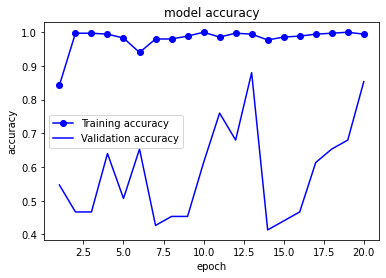

In [15]:
plot_epochs = range(1, len(acc)+1)
# Accuracy
plt.plot(plot_epochs, acc, 'bo-', label='Training accuracy')
plt.plot(plot_epochs, val_acc, 'b', label='Validation accuracy')
plt.title('model accuracy')
plt.ylabel('accuracy')  #Y-axis label
plt.xlabel('epoch')  #X-axis label
plt.legend()
plt.show()

In [16]:
loss = history.history['loss']
val_loss = history.history['val_loss']

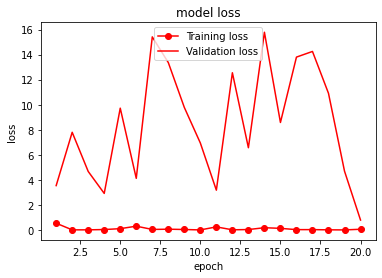

In [17]:
plot_epochs = range(1, len(loss)+1)
# Accuracy
plt.plot(plot_epochs, loss, 'ro-', label='Training loss')
plt.plot(plot_epochs, val_loss, 'r', label='Validation loss')
plt.title('model loss')
plt.ylabel('loss')  #Y-axis label
plt.xlabel('epoch')  #X-axis label
plt.legend()
plt.show()

In [18]:
y_pred = model.predict(X_test)

In [19]:
y_prediction_n = []
y_test_n = []
for i in range(0, len(y_pred)):
  max_n = max(y_pred[i])
  max_m = max(y_test[i])
  index_n = [index_n for index_n, j in enumerate(y_pred[i]) if j == max_n]
  index_m = [index_m for index_m, j in enumerate(y_test[i]) if j == max_m]
  y_prediction_n.append(index_n)
  y_test_n.append(index_m)

In [20]:
from sklearn.metrics import classification_report
print(classification_report(y_test_n, y_prediction_n,
                            target_names=["batik_kembang_cengkih",
                                          "batik_granitan",
                                          "batik_abstrak",
                                          "batik_sembagi",
                                          "batik_sinaran",
                                          "batik_jung_agung",
                                          "batik_sekar_jagat",
                                          "batik_tambal",
                                          "batik_siger_ratu_agung",
                                          "batik_kambil_sicukil"]))

                        precision    recall  f1-score   support

 batik_kembang_cengkih       1.00      1.00      1.00         9
        batik_granitan       1.00      1.00      1.00        11
         batik_abstrak       0.89      1.00      0.94         8
         batik_sembagi       1.00      1.00      1.00         5
         batik_sinaran       1.00      1.00      1.00         5
      batik_jung_agung       1.00      0.80      0.89         5
     batik_sekar_jagat       0.67      0.89      0.76         9
          batik_tambal       0.33      1.00      0.50         5
batik_siger_ratu_agung       0.67      0.33      0.44         6
  batik_kambil_sicukil       1.00      0.17      0.29        12

              accuracy                           0.79        75
             macro avg       0.86      0.82      0.78        75
          weighted avg       0.88      0.79      0.77        75



In [21]:
y_pred = np.argmax(model.predict(X_test), axis=-1)
y_pred

array([5, 6, 2, 7, 5, 6, 1, 4, 4, 9, 2, 8, 6, 7, 6, 2, 6, 7, 1, 7, 2, 4,
       7, 2, 2, 5, 6, 1, 1, 7, 8, 7, 0, 3, 7, 0, 3, 4, 2, 8, 7, 1, 3, 7,
       0, 1, 5, 0, 6, 2, 1, 1, 9, 7, 6, 0, 2, 7, 0, 7, 3, 1, 7, 7, 6, 1,
       6, 4, 0, 1, 0, 3, 0, 6, 6])

In [22]:
y_test_class = np.argmax(y_test, axis=1)

In [23]:
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sn
print(accuracy_score(y_test_class, y_pred))
confusion_matrix(y_test_class, y_pred)

0.7866666666666666


array([[ 9,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 11,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  8,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  5,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  5,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  4,  0,  0,  1,  0],
       [ 0,  0,  1,  0,  0,  0,  8,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  5,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  4,  0,  2,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 10,  0,  2]])

<Axes: >

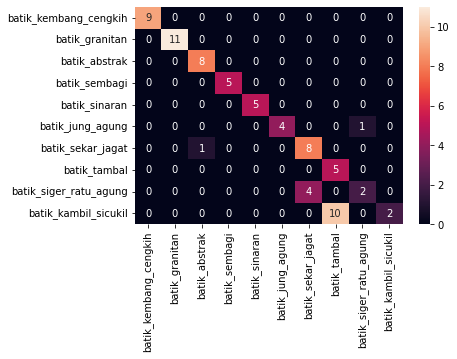

In [24]:
cm = confusion_matrix(y_test_class, y_pred)
sn.heatmap(cm, annot=True, xticklabels=["batik_kembang_cengkih",
                                        "batik_granitan",
                                        "batik_abstrak",
                                        "batik_sembagi",
                                        "batik_sinaran",
                                        "batik_jung_agung",
                                        "batik_sekar_jagat",
                                        "batik_tambal",
                                        "batik_siger_ratu_agung",
                                        "batik_kambil_sicukil"],
           yticklabels=["batik_kembang_cengkih",
                        "batik_granitan",
                        "batik_abstrak",
                        "batik_sembagi",
                        "batik_sinaran",
                        "batik_jung_agung",
                        "batik_sekar_jagat",
                        "batik_tambal",
                        "batik_siger_ratu_agung",
                        "batik_kambil_sicukil"])

In [25]:
y_pred = model.predict(X_valid)
y_prediction_n = []
y_valid_n = []
for i in range(0, len(y_pred)):
  max_n = max(y_pred[i])
  max_m = max(y_valid[i])
  index_n = [index_n for index_n, j in enumerate(y_pred[i]) if j == max_n]
  index_m = [index_m for index_m, j in enumerate(y_valid[i]) if j == max_m]
  y_prediction_n.append(index_n)
  y_valid_n.append(index_m)

In [26]:
from sklearn.metrics import classification_report
print(classification_report(y_valid_n, y_prediction_n, target_names=["batik_kembang_cengkih",
                                                                    "batik_granitan",
                                                                    "batik_abstrak",
                                                                    "batik_sembagi",
                                                                    "batik_sinaran",
                                                                    "batik_jung_agung",
                                                                    "batik_sekar_jagat",
                                                                    "batik_tambal",
                                                                    "batik_siger_ratu_agung",
                                                                    "batik_kambil_sicukil"]))

                        precision    recall  f1-score   support

 batik_kembang_cengkih       1.00      1.00      1.00         9
        batik_granitan       1.00      1.00      1.00        10
         batik_abstrak       0.60      1.00      0.75         3
         batik_sembagi       1.00      1.00      1.00         7
         batik_sinaran       1.00      0.89      0.94         9
      batik_jung_agung       1.00      0.57      0.73         7
     batik_sekar_jagat       0.89      0.80      0.84        10
          batik_tambal       0.58      1.00      0.74         7
batik_siger_ratu_agung       0.67      0.86      0.75         7
  batik_kambil_sicukil       1.00      0.33      0.50         6

              accuracy                           0.85        75
             macro avg       0.87      0.85      0.82        75
          weighted avg       0.90      0.85      0.85        75



In [27]:
# Define the class labels
class_labels = ["batik_kembang_cengkih",
                "batik_granitan",
                "batik_abstrak",
                "batik_sembagi",
                "batik_sinaran",
                "batik_jung_agung",
                "batik_sekar_jagat",
                "batik_tambal",
                "batik_siger_ratu_agung",
                "batik_kambil_sicukil"]

In [28]:
# Make predictions on the test set
predictions = model.predict(X_test)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test, axis=1)

Successful predictions:
True label: batik_jung_agung, Predicted label: batik_jung_agung


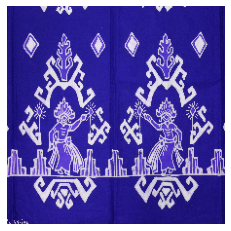

True label: batik_sekar_jagat, Predicted label: batik_sekar_jagat


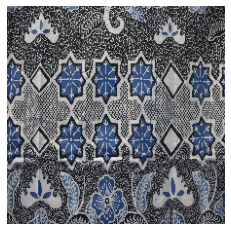

True label: batik_abstrak, Predicted label: batik_abstrak


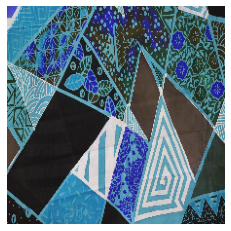

True label: batik_jung_agung, Predicted label: batik_jung_agung


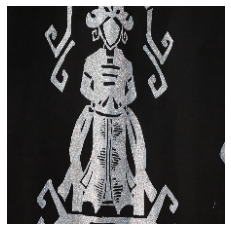

True label: batik_sekar_jagat, Predicted label: batik_sekar_jagat


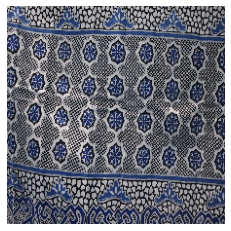

True label: batik_granitan, Predicted label: batik_granitan


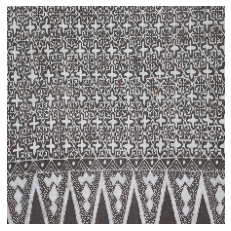

True label: batik_sinaran, Predicted label: batik_sinaran


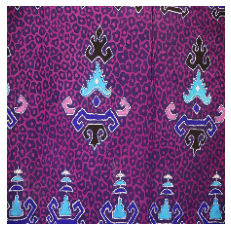

True label: batik_sinaran, Predicted label: batik_sinaran


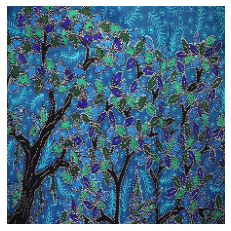

True label: batik_kambil_sicukil, Predicted label: batik_kambil_sicukil


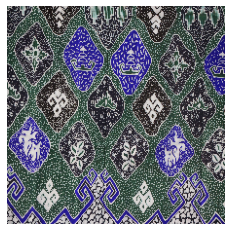

True label: batik_abstrak, Predicted label: batik_abstrak


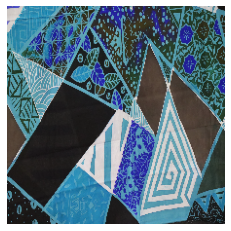

True label: batik_siger_ratu_agung, Predicted label: batik_siger_ratu_agung


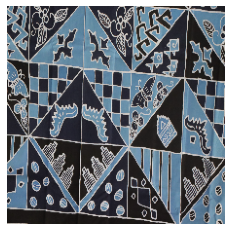

True label: batik_abstrak, Predicted label: batik_abstrak


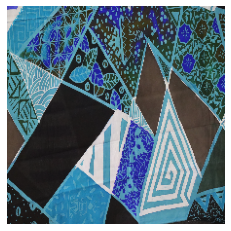

True label: batik_sekar_jagat, Predicted label: batik_sekar_jagat


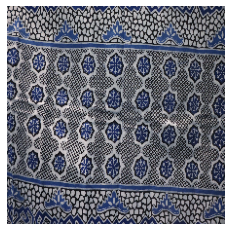

True label: batik_tambal, Predicted label: batik_tambal


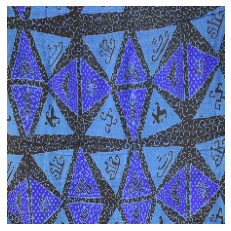

True label: batik_granitan, Predicted label: batik_granitan


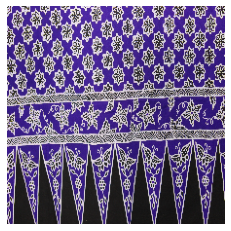

True label: batik_sinaran, Predicted label: batik_sinaran


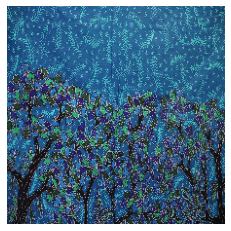

True label: batik_abstrak, Predicted label: batik_abstrak


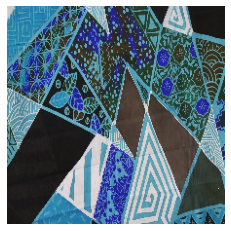

True label: batik_abstrak, Predicted label: batik_abstrak


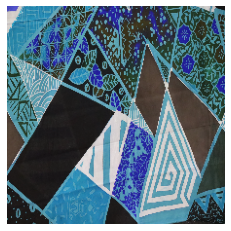

True label: batik_jung_agung, Predicted label: batik_jung_agung


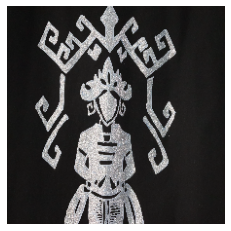

True label: batik_sekar_jagat, Predicted label: batik_sekar_jagat


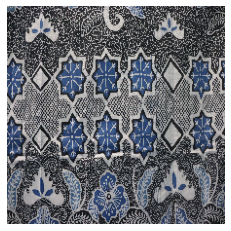

True label: batik_granitan, Predicted label: batik_granitan


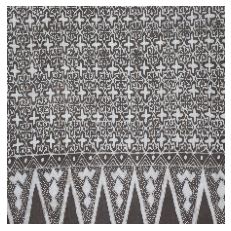

True label: batik_granitan, Predicted label: batik_granitan


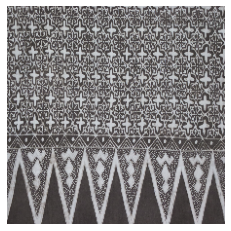

True label: batik_tambal, Predicted label: batik_tambal


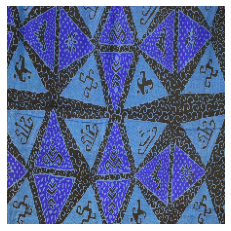

True label: batik_kembang_cengkih, Predicted label: batik_kembang_cengkih


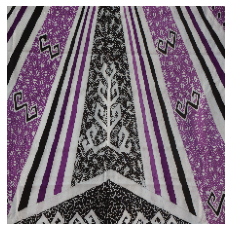

True label: batik_sembagi, Predicted label: batik_sembagi


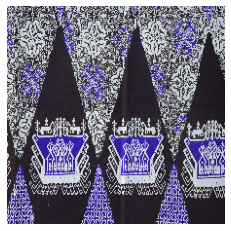

True label: batik_kembang_cengkih, Predicted label: batik_kembang_cengkih


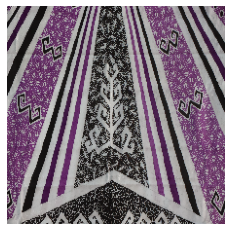

True label: batik_sembagi, Predicted label: batik_sembagi


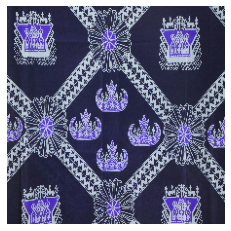

True label: batik_sinaran, Predicted label: batik_sinaran


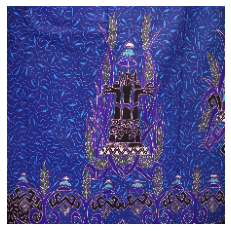

True label: batik_abstrak, Predicted label: batik_abstrak


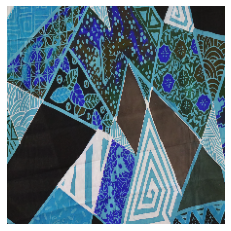

True label: batik_siger_ratu_agung, Predicted label: batik_siger_ratu_agung


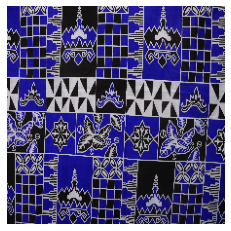

True label: batik_granitan, Predicted label: batik_granitan


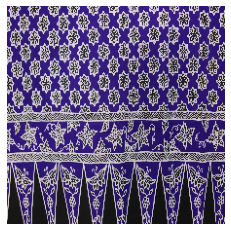

True label: batik_sembagi, Predicted label: batik_sembagi


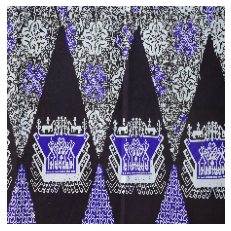

True label: batik_kembang_cengkih, Predicted label: batik_kembang_cengkih


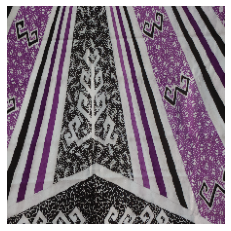

True label: batik_granitan, Predicted label: batik_granitan


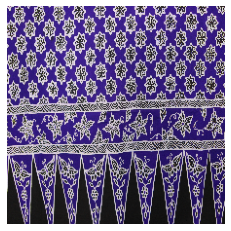

True label: batik_jung_agung, Predicted label: batik_jung_agung


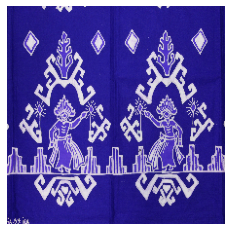

True label: batik_kembang_cengkih, Predicted label: batik_kembang_cengkih


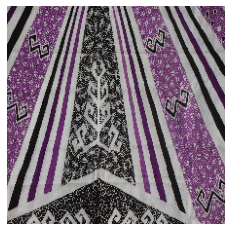

True label: batik_sekar_jagat, Predicted label: batik_sekar_jagat


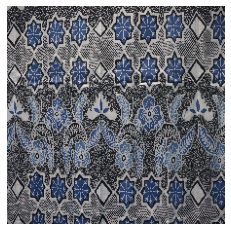

True label: batik_abstrak, Predicted label: batik_abstrak


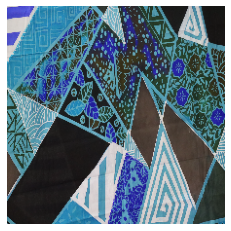

True label: batik_granitan, Predicted label: batik_granitan


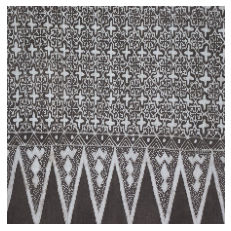

True label: batik_granitan, Predicted label: batik_granitan


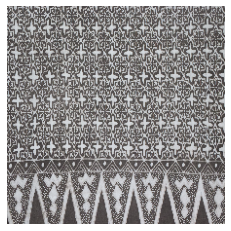

True label: batik_kambil_sicukil, Predicted label: batik_kambil_sicukil


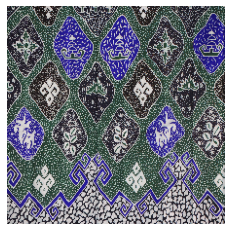

True label: batik_tambal, Predicted label: batik_tambal


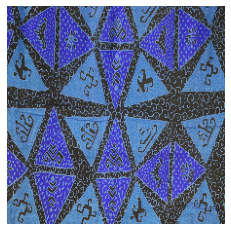

True label: batik_sekar_jagat, Predicted label: batik_sekar_jagat


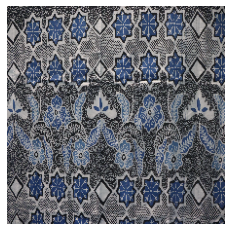

True label: batik_kembang_cengkih, Predicted label: batik_kembang_cengkih


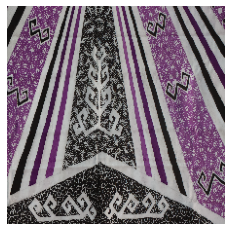

True label: batik_abstrak, Predicted label: batik_abstrak


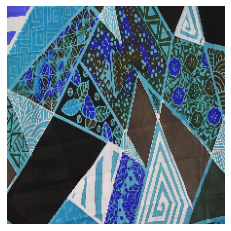

True label: batik_tambal, Predicted label: batik_tambal


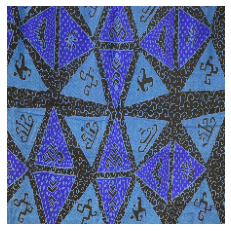

True label: batik_kembang_cengkih, Predicted label: batik_kembang_cengkih


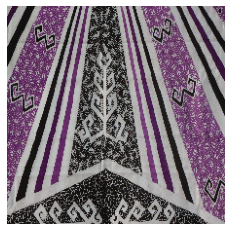

True label: batik_sembagi, Predicted label: batik_sembagi


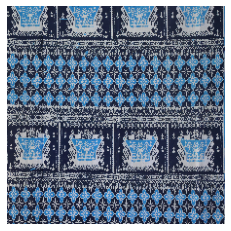

True label: batik_granitan, Predicted label: batik_granitan


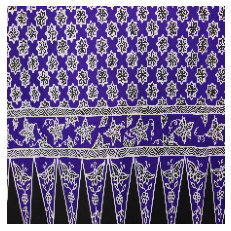

True label: batik_tambal, Predicted label: batik_tambal


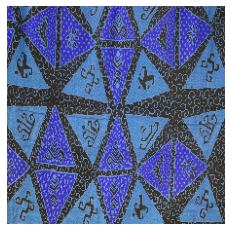

True label: batik_granitan, Predicted label: batik_granitan


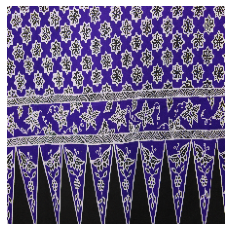

True label: batik_sekar_jagat, Predicted label: batik_sekar_jagat


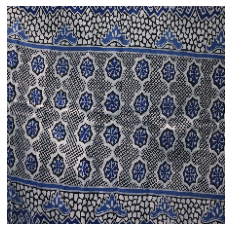

True label: batik_sinaran, Predicted label: batik_sinaran


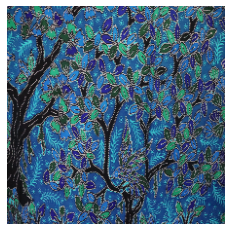

True label: batik_kembang_cengkih, Predicted label: batik_kembang_cengkih


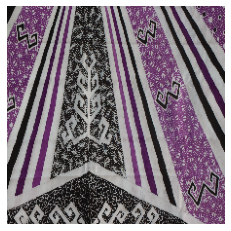

True label: batik_granitan, Predicted label: batik_granitan


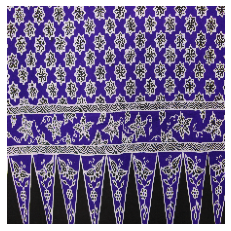

True label: batik_kembang_cengkih, Predicted label: batik_kembang_cengkih


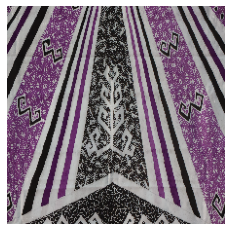

True label: batik_sembagi, Predicted label: batik_sembagi


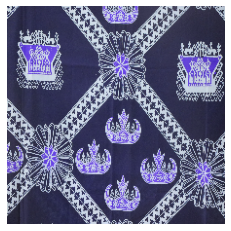

True label: batik_kembang_cengkih, Predicted label: batik_kembang_cengkih


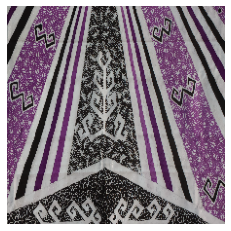

True label: batik_sekar_jagat, Predicted label: batik_sekar_jagat


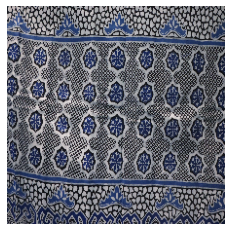

In [29]:
# Display successful predictions
print("Successful predictions:")
for i in range(len(X_test)):
    if predicted_labels[i] == true_labels[i]:
        print(f"True label: {class_labels[true_labels[i]]}, Predicted label: {class_labels[predicted_labels[i]]}")
        plt.imshow(X_test[i])
        # plt.title(f"True label: {class_labels[true_labels[i]]}, Predicted label: {class_labels[predicted_labels[i]]}")
        plt.axis('off')
        plt.show()


Unsuccessful predictions:
True label: batik_kambil_sicukil, Predicted label: batik_tambal


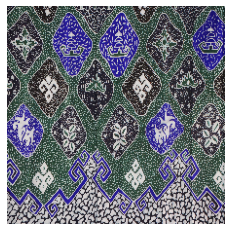

True label: batik_siger_ratu_agung, Predicted label: batik_sekar_jagat


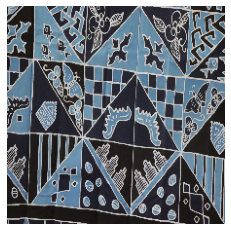

True label: batik_kambil_sicukil, Predicted label: batik_tambal


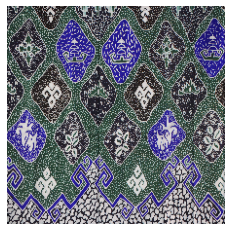

True label: batik_siger_ratu_agung, Predicted label: batik_sekar_jagat


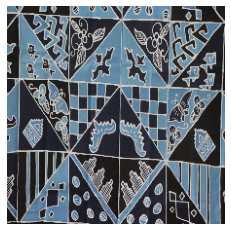

True label: batik_kambil_sicukil, Predicted label: batik_tambal


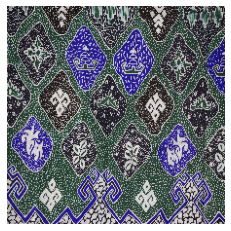

True label: batik_sekar_jagat, Predicted label: batik_abstrak


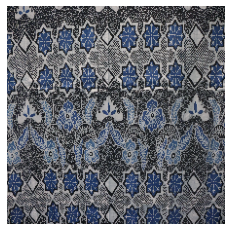

True label: batik_kambil_sicukil, Predicted label: batik_tambal


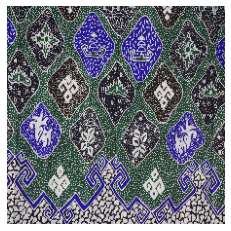

True label: batik_kambil_sicukil, Predicted label: batik_tambal


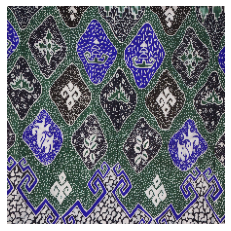

True label: batik_jung_agung, Predicted label: batik_siger_ratu_agung


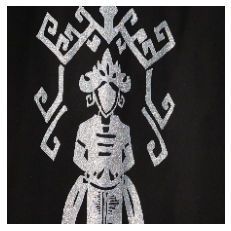

True label: batik_kambil_sicukil, Predicted label: batik_tambal


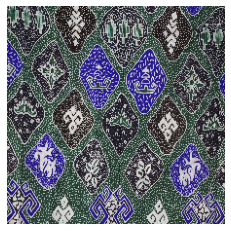

True label: batik_kambil_sicukil, Predicted label: batik_tambal


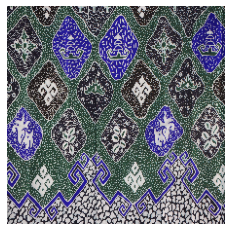

True label: batik_kambil_sicukil, Predicted label: batik_tambal


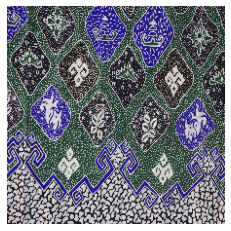

True label: batik_kambil_sicukil, Predicted label: batik_tambal


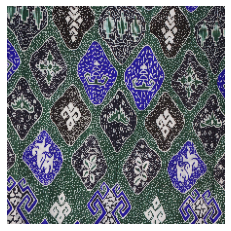

True label: batik_kambil_sicukil, Predicted label: batik_tambal


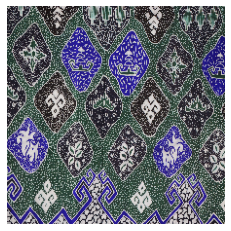

True label: batik_siger_ratu_agung, Predicted label: batik_sekar_jagat


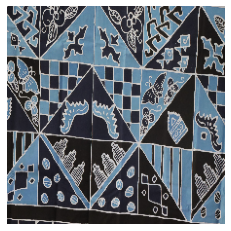

True label: batik_siger_ratu_agung, Predicted label: batik_sekar_jagat


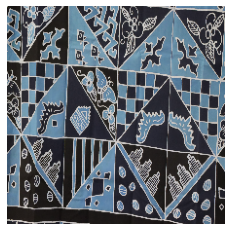

In [30]:
# Display unsuccessful predictions
print("\nUnsuccessful predictions:")
for i in range(len(X_test)):
    if predicted_labels[i] != true_labels[i]:
        print(f"True label: {class_labels[true_labels[i]]}, Predicted label: {class_labels[predicted_labels[i]]}")
        plt.imshow(X_test[i])
        # plt.title(f"True label: {class_labels[true_labels[i]]}, Predicted label: {class_labels[predicted_labels[i]]}")
        plt.axis('off')
        plt.show()